In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import scikitplot as skplt
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score, accuracy_score

In [36]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [2]:
disbursment = pd.read_csv('disbursment.csv', index_col=False)

In [3]:
df = disbursment.copy()

# Preparation

In [4]:
df.head()

,age,live_province,live_city,live_area_big,live_area_small,sex,marital,bank,salary,amount,penalty_day
0,28,DKI Jakarta,Jakarta Selatan,Pesanggrahan,Bintaro,0,3,MANDIRI,5555555,507350.0,61
1,19,Jawa Tengah,Semarang,Semarang Utara,Purwosari,0,4,MANDIRI,644552585855,514700.0,23
2,38,DKI Jakarta,Jakarta Utara,Pademangan,Ancol,0,3,MANDIRI,585858,507350.0,30
3,18,DKI Jakarta,Jakarta Timur,Pasar Rebo,Baru,0,3,MANDIRI,979764,514700.0,46
4,37,DKI Jakarta,Jakarta Utara,Cilincing,Kali Baru,1,4,MANDIRI,865656,1029400.0,0


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,16695.0,3.233214e+01,6.790518e+00,18.0,27.0,32.0,37.0,5.800000e+01
sex,16695.0,4.392932e-01,4.963159e-01,0.0,0.0,0.0,1.0,1.000000e+00
marital,16695.0,1.652471e+00,5.699871e-01,1.0,1.0,2.0,2.0,4.000000e+00
salary,16695.0,6.041675e+08,2.034565e+10,2.0,3500000.0,4300000.0,6000000.0,9.886643e+11
amount,16695.0,5.392538e+05,9.569892e+04,5073.0,507500.0,510500.0,510500.0,1.327300e+06
penalty_day,16695.0,9.397880e+01,1.627448e+02,0.0,0.0,0.0,188.0,5.900000e+02


In [7]:
df.describe(include='object').T

,count,unique,top,freq
live_province,16695,31,Jawa Barat,4833
live_city,16688,294,Jakarta Timur,1249
live_area_big,16686,1301,Cengkareng,242
live_area_small,16680,2802,Klender,80
bank,16695,54,BCA,9063


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16695 entries, 0 to 16694
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              16695 non-null  int64  
 1   live_province    16695 non-null  object 
 2   live_city        16688 non-null  object 
 3   live_area_big    16686 non-null  object 
 4   live_area_small  16680 non-null  object 
 5   sex              16695 non-null  int64  
 6   marital          16695 non-null  int64  
 7   bank             16695 non-null  object 
 8   salary           16695 non-null  int64  
 9   amount           16695 non-null  float64
 10  penalty_day      16695 non-null  int64  
dtypes: float64(1), int64(5), object(5)
memory usage: 1.4+ MB


In [9]:
df.dtypes.value_counts()

int64      5
object     5
float64    1
dtype: int64

In [10]:
df.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

live_province        31
live_city           294
live_area_big      1301
live_area_small    2802
bank                 54
dtype: int64

## Missing Values

In [11]:
#Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * mis_val / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [12]:
missing_values_train = missing_values_table(df)
missing_values_train.head(10)

Your selected dataframe has 11 columns.
There are 3 columns that have missing values.


,Missing Values,% of Total Values
live_area_small,15,0.1
live_area_big,9,0.1
live_city,7,0.0


In [13]:
import chart_studio
import chart_studio.plotly as py
import plotly.graph_objs as go
chart_studio.tools.set_credentials_file(username='jayb1544', api_key='Tpumbrlqsk6FxdNrBgsJ')

In [14]:
df = df.drop(columns=['live_area_small', 'live_area_big'])

In [104]:
missing_values_train = missing_values_table(df)
missing_values_train.head(10)

Your selected dataframe has 10 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [16]:
df['live_city'] = df['live_city'].fillna('missing')

## One Hot Encoding

In [21]:
df_onehot = df.copy()
df_onehot = pd.get_dummies(df_onehot, columns=['live_province'], prefix = ['live_province:'])

df_onehot.head()

,age,live_city,sex,marital,bank,salary,amount,penalty_day,live_province:_Bali,live_province:_Banten,...,live_province:_Nusa Tenggara Timur,live_province:_Papua Barat,live_province:_Riau,live_province:_Sulawesi Selatan,live_province:_Sulawesi Tengah,live_province:_Sulawesi Tenggara,live_province:_Sulawesi Utara,live_province:_Sumatera Barat,live_province:_Sumatera Selatan,live_province:_Sumatera Utara
0,28,Jakarta Selatan,0,3,MANDIRI,5555555,507350.0,61,0,0,...,0,0,0,0,0,0,0,0,0,0
1,19,Semarang,0,4,MANDIRI,644552585855,514700.0,23,0,0,...,0,0,0,0,0,0,0,0,0,0
2,38,Jakarta Utara,0,3,MANDIRI,585858,507350.0,30,0,0,...,0,0,0,0,0,0,0,0,0,0
3,18,Jakarta Timur,0,3,MANDIRI,979764,514700.0,46,0,0,...,0,0,0,0,0,0,0,0,0,0
4,37,Jakarta Utara,1,4,MANDIRI,865656,1029400.0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
df_onehot = pd.get_dummies(df_onehot, columns=['live_city'], prefix = ['live_city:'])

df_onehot.head()

,age,sex,marital,bank,salary,amount,penalty_day,live_province:_Bali,live_province:_Banten,live_province:_Bengkulu,...,live_city:_Kota Tegal,live_city:_Kota Ternate,live_city:_Kota Tidore Kepulauan,live_city:_Kota Tomohon,live_city:_Kota Tual,live_city:_Kota Yogyakarta,live_city:_Medan,live_city:_Semarang,live_city:_Surabaya,live_city:_missing
0,28,0,3,MANDIRI,5555555,507350.0,61,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,19,0,4,MANDIRI,644552585855,514700.0,23,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,38,0,3,MANDIRI,585858,507350.0,30,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,18,0,3,MANDIRI,979764,514700.0,46,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,37,1,4,MANDIRI,865656,1029400.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
df_onehot = pd.get_dummies(df_onehot, columns=['bank'], prefix = ['bank:'])

df_onehot.head()

,age,sex,marital,salary,amount,penalty_day,live_province:_Bali,live_province:_Banten,live_province:_Bengkulu,live_province:_DKI Jakarta,...,bank:_PERMATA_UUS,bank:_RIAU_DAN_KEPRI,bank:_SINARMAS,bank:_SULUT,bank:_SUMATERA_BARAT,bank:_SUMSEL_DAN_BABEL,bank:_SUMUT,bank:_TABUNGAN_PENSIUNAN_NASIONAL,bank:_UOB,bank:_VICTORIA_INTERNASIONAL
0,28,0,3,5555555,507350.0,61,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,19,0,4,644552585855,514700.0,23,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,38,0,3,585858,507350.0,30,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,18,0,3,979764,514700.0,46,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,37,1,4,865656,1029400.0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


## Cleaning Outliers

In [81]:
df_onehot = df_onehot[df_onehot['salary'].between(df_onehot['salary'].quantile(.05), 
                                                        df_onehot['salary'].quantile(.95))]

## Labelling the Target

In [26]:
df_onehot['Label'] = [0 if x>14 else 1 for x in df['penalty_day']]

# Correlation

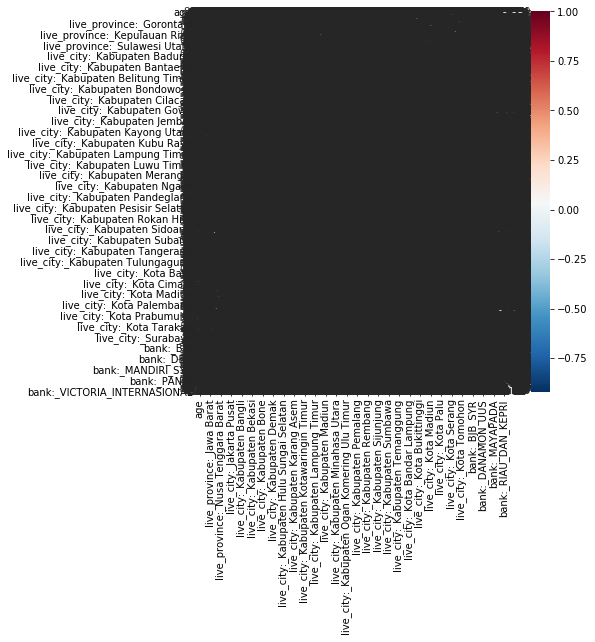

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

corrmat = df_onehot.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(7,7))
#plot heat map
g=sns.heatmap(df_onehot[top_corr_features].corr(),annot=True,cmap="RdBu_r")

In [31]:
correlation = df_onehot[top_corr_features].corr()

In [37]:
correlation

,age,sex,marital,salary,amount,penalty_day,live_province:_Bali,live_province:_Banten,live_province:_Bengkulu,live_province:_DKI Jakarta,live_province:_Di Yogyakarta,live_province:_Gorontalo,live_province:_Jambi,live_province:_Jawa Barat,live_province:_Jawa Tengah,live_province:_Jawa Timur,live_province:_Kalimantan Barat,live_province:_Kalimantan Selatan,live_province:_Kalimantan Tengah,live_province:_Kalimantan Timur,live_province:_Kalimantan Utara,live_province:_Kepulauan Bangka Belitung,live_province:_Kepulauan Riau,live_province:_Lampung,live_province:_Maluku,live_province:_Maluku Utara,live_province:_Nusa Tenggara Barat,live_province:_Nusa Tenggara Timur,live_province:_Papua Barat,live_province:_Riau,live_province:_Sulawesi Selatan,live_province:_Sulawesi Tengah,live_province:_Sulawesi Tenggara,live_province:_Sulawesi Utara,live_province:_Sumatera Barat,live_province:_Sumatera Selatan,live_province:_Sumatera Utara,live_city:_Bandung,live_city:_Jakarta Barat,live_city:_Jakarta Pusat,live_city:_Jakarta Selatan,live_city:_Jakarta Timur,live_city:_Jakarta Utara,live_city:_Kabupaten Agam,live_city:_Kabupaten Badung,live_city:_Kabupaten Bandung,live_city:_Kabupaten Bandung Barat,live_city:_Kabupaten Banggai,live_city:_Kabupaten Banggai Kepulauan,live_city:_Kabupaten Bangka,live_city:_Kabupaten Bangka Tengah,live_city:_Kabupaten Bangkalan,live_city:_Kabupaten Bangli,live_city:_Kabupaten Banjar,live_city:_Kabupaten Banjarnegara,live_city:_Kabupaten Bantaeng,live_city:_Kabupaten Bantul,live_city:_Kabupaten Banyu Asin,live_city:_Kabupaten Banyumas,live_city:_Kabupaten Banyuwangi,live_city:_Kabupaten Barito Kuala,live_city:_Kabupaten Barito Selatan,live_city:_Kabupaten Barito Utara,live_city:_Kabupaten Batang,live_city:_Kabupaten Batu Bara,live_city:_Kabupaten Bekasi,live_city:_Kabupaten Belitung Timur,live_city:_Kabupaten Belu,live_city:_Kabupaten Bengkalis,live_city:_Kabupaten Bengkulu Selatan,live_city:_Kabupaten Bengkulu Utara,live_city:_Kabupaten Berau,live_city:_Kabupaten Bima,live_city:_Kabupaten Blitar,live_city:_Kabupaten Blora,live_city:_Kabupaten Bogor,live_city:_Kabupaten Bojonegoro,live_city:_Kabupaten Bondowoso,live_city:_Kabupaten Bone,live_city:_Kabupaten Bone Bolango,live_city:_Kabupaten Boyolali,live_city:_Kabupaten Brebes,live_city:_Kabupaten Buleleng,live_city:_Kabupaten Bulukumba,live_city:_Kabupaten Bulungan,live_city:_Kabupaten Bungo,live_city:_Kabupaten Ciamis,live_city:_Kabupaten Cianjur,live_city:_Kabupaten Cilacap,live_city:_Kabupaten Cirebon,live_city:_Kabupaten Deli Serdang,live_city:_Kabupaten Demak,live_city:_Kabupaten Dharmasraya,live_city:_Kabupaten Ende,live_city:_Kabupaten Enrekang,live_city:_Kabupaten Garut,live_city:_Kabupaten Gianyar,live_city:_Kabupaten Gorontalo,live_city:_Kabupaten Gorontalo Utara,live_city:_Kabupaten Gowa,live_city:_Kabupaten Gresik,live_city:_Kabupaten Grobogan,live_city:_Kabupaten Gunung Kidul,live_city:_Kabupaten Halmahera Timur,live_city:_Kabupaten Hulu Sungai Selatan,live_city:_Kabupaten Hulu Sungai Tengah,live_city:_Kabupaten Hulu Sungai Utara,live_city:_Kabupaten Indragiri Hilir,live_city:_Kabupaten Indragiri Hulu,live_city:_Kabupaten Indramayu,live_city:_Kabupaten Jember,live_city:_Kabupaten Jembrana,live_city:_Kabupaten Jeneponto,live_city:_Kabupaten Jepara,live_city:_Kabupaten Jombang,live_city:_Kabupaten Kampar,live_city:_Kabupaten Kapuas Hulu,live_city:_Kabupaten Karang Asem,live_city:_Kabupaten Karanganyar,live_city:_Kabupaten Karawang,live_city:_Kabupaten Karimun,live_city:_Kabupaten Kayong Utara,live_city:_Kabupaten Kebumen,live_city:_Kabupaten Kediri,live_city:_Kabupaten Kendal,live_city:_Kabupaten Kepulauan Seribu,live_city:_Kabupaten Klaten,live_city:_Kabupaten Klungkung,live_city:_Kabupaten Kolaka,live_city:_Kabupaten Kotawaringin Barat,live_city:_Kabupaten Kotawaringin Timur,live_city:_Kabupaten Kuantan Singingi,live_city:_Kabupaten Kubu Raya,live_city:_Kabupaten Kudus,live_city:_Kabupaten Kulon Progo,live_city:_Kabupaten Kuningan,live_city:_Kabupaten Kuta

In [38]:
df_onehot = df_onehot.drop(columns=['penalty_day'])

In [82]:
df_onehot.describe().T

,count,mean,std,min,25%,50%,75%,max
age,15119.0,3.230319e+01,6.741098e+00,19.0,27.0,32.0,37.0,56.0
sex,15119.0,4.330313e-01,4.955113e-01,0.0,0.0,0.0,1.0,1.0
marital,15119.0,1.651895e+00,5.698308e-01,1.0,1.0,2.0,2.0,4.0
salary,15119.0,4.738333e+06,1.541038e+06,2400000.0,3600000.0,4350000.0,5500000.0,9000000.0
amount,15119.0,5.391198e+05,9.534114e+04,503500.0,507500.0,510500.0,510500.0,1327300.0
live_province:_Bali,15119.0,1.620478e-02,1.262665e-01,0.0,0.0,0.0,0.0,1.0
live_province:_Banten,15119.0,9.716251e-02,2.961887e-01,0.0,0.0,0.0,0.0,1.0
live_province:_Bengkulu,15119.0,1.455123e-03,3.811957e-02,0.0,0.0,0.0,0.0,1.0
live_province:_DKI Jakarta,15119.0,2.930088e-01,4.551575e-01,0.0,0.0,0.0,1.0,1.0
live_province:_Di Yogyakarta,15119.0,6.217342e-03,7.860722e-02,0.0,0.0,0.0,0.0,1.0


# Time for Train-Test-Split

* 60% Training
* 20% Validation
* 20% Test

## using StandardScaler

In [83]:
#drop the predicted column
data = df_onehot.drop(columns=['Label'])
answer = df_onehot['Label']

In [84]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_break, X_test, y_break, y_test = train_test_split(data, answer, \
                                                    test_size=0.2, stratify=answer,
                                                    random_state=42)

#random_state generates a set kind of deck for each random state. 42 will always be the same kind of split
X_train, X_val, y_train, y_val = train_test_split(X_break, y_break, \
                                                    test_size=0.25, stratify=y_break,
                                                    random_state=42)
# Initialize fit StandardScaler
std_scale = StandardScaler().fit(X_train)

# Scale data
X_train_std = std_scale.transform(X_train)
X_val_std = std_scale.transform(X_val)
X_test_std = std_scale.transform(X_test)

## To deal with the imbalanced classes, we will use undersampling

In [85]:
from imblearn.under_sampling import RandomUnderSampler

X_train_under, y_train_under = RandomUnderSampler(random_state=42).fit_sample(X_train_std,y_train)
X_val_under, y_val_under = RandomUnderSampler(random_state=42).fit_sample(X_val_std,y_val)

# Algorithms

## Logistic Regression

In [110]:
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV

# Run CV with 5 folds (logit)

solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
param_grid = dict(solver=solvers,penalty=penalty,C=c_values)

logistic = linear_model.LogisticRegression(solver='lbfgs', max_iter=10000)
logistic_grid = GridSearchCV(logistic, param_grid, cv=5, scoring='roc_auc', verbose=10, n_jobs=-1)
logistic_grid.fit(X_train_under, y_train_under)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   17.9s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   23.8s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   26.4s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   34.2s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   36.8s
[Parallel(n_jobs=-1)]: Done  60 out of  75 | elapsed:   39.1s remaining:    9.7s
[Parallel(n_jobs=-1)]: Done  68 out of  75 | elapsed:   39.7s remaining:    4.0s
[Parallel(n_jobs=-1)]: Done  75 out of  75 | elapsed:   40.0s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=10000, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': [100, 10, 1.0, 0.1, 0.01], 'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=10)

## Naive Bayes

In [87]:
from sklearn.naive_bayes import GaussianNB

# Fit a Naive Bayes Model

gnb = GaussianNB()
gnb_best = gnb.fit(X_train_under, y_train_under)

## Gradient Boosting Machine (GBM)

## Random Forest

In [88]:
from sklearn.ensemble import RandomForestClassifier

# Run CV with 5 folds (Random Forest)

# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [5, 10, 15],
    'max_features': ['sqrt'],
    'min_samples_leaf': [10, 20],
    'min_samples_split': [2, 5],
    'n_estimators': [500, 700]
}

rf = RandomForestClassifier()
rf_grid = GridSearchCV(rf, param_grid, cv=5, scoring='roc_auc', verbose=10, n_jobs=-1)
rf_grid.fit(X_train_under,y_train_under)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   26.6s
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 110 out of 120 | elapsed:  2.6min remaining:   13.9s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:  2.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

## Dummy Classifier

In [89]:
from sklearn.dummy import DummyClassifier

dummy = DummyClassifier()
dummy.fit(X_train_under, y_train_under)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\dummy.py:132: FutureWarning:

The default value of strategy will change from stratified to prior in 0.24.



DummyClassifier(constant=None, random_state=None, strategy='warn')

## Find ROC scores for all models

In [111]:
def roc_scores(X_value, Y_value):
    #in sample
    model_list = [logistic_grid.best_estimator_, 
#                   svm_grid.best_estimator_, 
                  gnb_best,
                  rf_grid.best_estimator_,
                  dummy
                 ]

    model_name = ['Logit','Naive Bayes','Random Forest','Dummy']

    # Plot ROC curve for all my models
    fig, ax = plt.subplots(figsize=(20,18))
    for i, model in enumerate(model_list):
        y_pred = list(model.predict_proba(X_value)[:,1])
        fpr, tpr, threshold = metrics.roc_curve(Y_value, y_pred)
        roc_auc = metrics.auc(fpr, tpr)
        plt.plot(fpr, tpr, label = (model_name[i] + ' AUC = %0.4f' % roc_auc),linewidth=2.0)
    ax.grid(False)
    ax.tick_params(length=6, width=2,labelsize = 30,
                   grid_color='r', grid_alpha=0.5)
    # plt.legend(loc = 'lower right',prop={'size': 25})
    leg = plt.legend(loc = 'lower right',prop={'size': 25})
    leg.get_frame().set_edgecolor('b')
    plt.title('Receiver Operating Characteristic (ROC)', FontSize=40)
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([-.02, 1.02])
    plt.ylim([-.02, 1.02])
    plt.ylabel('True Positive Rate',FontSize=30)
    plt.xlabel('False Positive Rate',FontSize=30)
    plt.show()

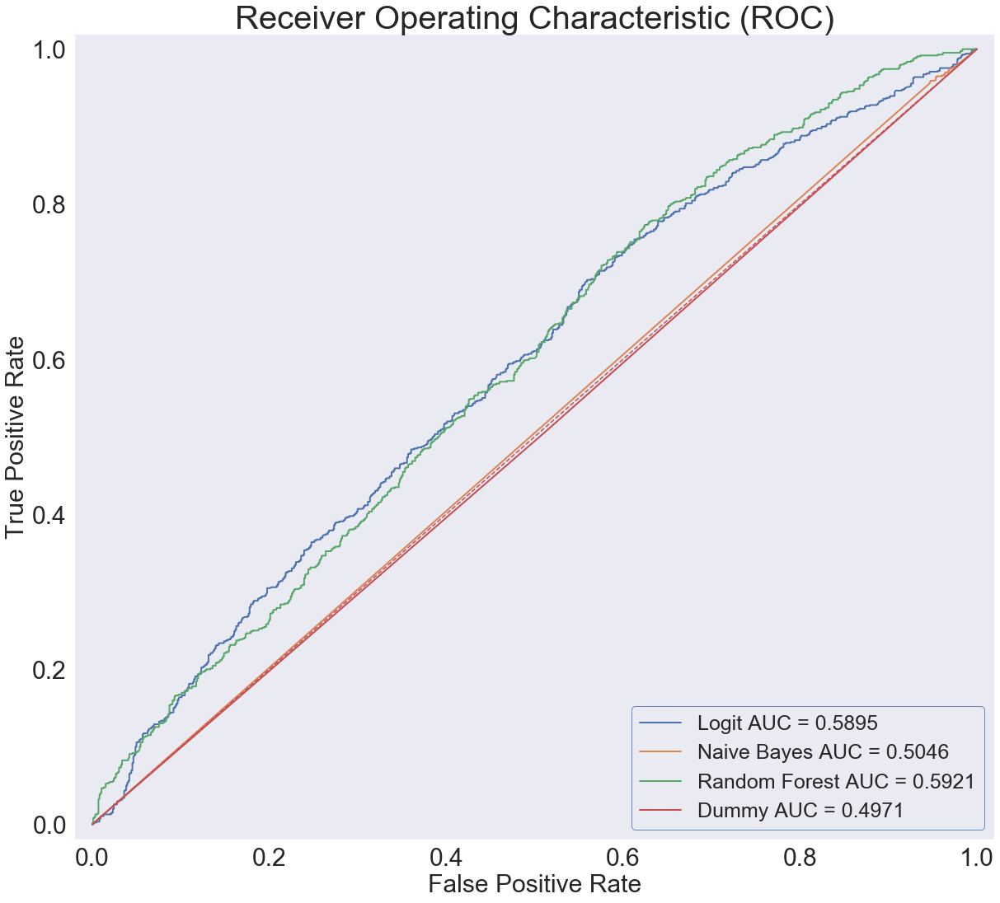

In [112]:
from sklearn.metrics import precision_score, recall_score, precision_recall_curve,f1_score, fbeta_score, accuracy_score
import sklearn.metrics as metrics

#in sample
roc_scores(X_val_under,y_val_under)

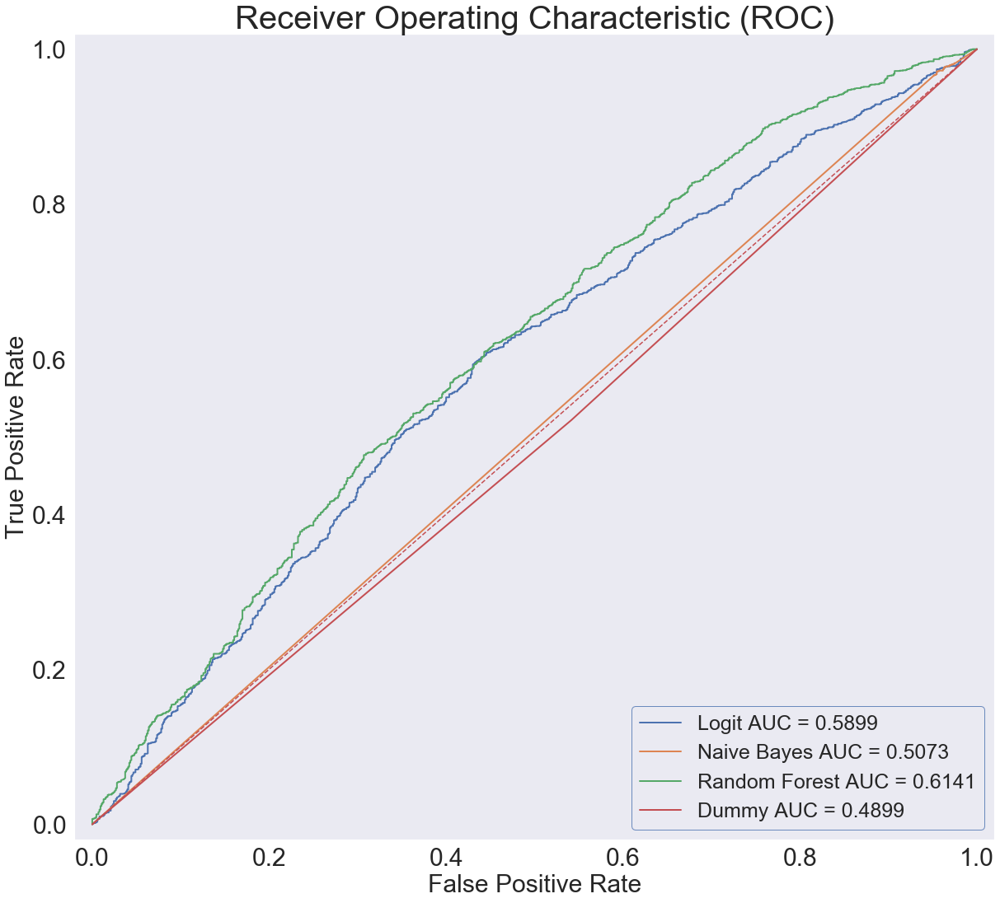

In [113]:
#out of sample
roc_scores(X_test_std,y_test)

## Find the best threshold for each model

In [93]:
def find_best_threshold(model, int_num_steps):
    highest_f1 = 0
    best_threshold = 0
    for threshold in np.linspace (0, 1, int_num_steps):
        y_predict = (model.predict_proba(X_val_under)[:, 1] >= threshold) 
        f1 = f1_score(y_val_under,y_predict)
        acc = accuracy_score(y_val_under,y_predict)
        rec = recall_score(y_val_under,y_predict)
        pre = precision_score(y_val_under,y_predict)
        if f1 > highest_f1:
            best_threshold, highest_f1, best_acc, best_rec, best_pre  = \
                threshold, f1, acc, rec, pre
    return best_threshold, highest_f1, best_acc, best_rec, best_pre

In [94]:
models = [logistic_grid, gnb_best, rf_grid]
model_names = ["Logistic Regression", "Naive-Bayes", "Random Forest"]
chart = list()
for item,name in zip(models,model_names):
    best_thresh, high_f1, high_acc, high_rec, high_pre = find_best_threshold(item,20)
#     print(f'Results for {name}:')
#     print('Best Threshold: ', best_thresh)
#     print('Highest_f1: ', high_f1)
    chart.append([name, best_thresh, high_f1, high_acc, high_rec, high_pre])

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

C:\ProgramData\Anaconda3\lib\site-pa

In [95]:
chart = pd.DataFrame(chart, columns=['Model', 'Best Threshhold','F1 Score','Accuracy','Recall','Precision'])

In [96]:
chart

,Model,Best Threshhold,F1 Score,Accuracy,Recall,Precision
0,Logistic Regression,0.000000,0.666667,0.500000,1.000000,0.500000
1,Naive-Bayes,0.000000,0.666667,0.500000,1.000000,0.500000
2,Random Forest,0.473684,0.671204,0.550581,0.917442,0.529175


## Confusion Matrix

In [97]:
from sklearn.metrics import confusion_matrix

def make_confusion_matrix_val(model, threshold=0.5):
    # Predict class 1 if probability of being in class 1 is greater than threshold
    # (model.predict(X_test) does this automatically with a threshold of 0.5)
    y_predict = (model.predict_proba(X_val_under)[:, 1] >= threshold)
    fraud_confusion = confusion_matrix(y_val_under, y_predict)
    plt.figure(dpi=100)
    sns.set(font_scale=1)
    sns.heatmap(fraud_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
           xticklabels=['Default', 'Not Default'],
           yticklabels=['Default', 'Not Default']);
    TP = fraud_confusion[0][0]
    FP = fraud_confusion[0][1]
    FN = fraud_confusion[1][0]
    TN = fraud_confusion[1][1]
    plt.yticks(rotation = 0)
    plt.title('Predicted vs. Actual',fontname = '.SF Compact Display',fontsize = 20,pad = 10);
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

In [98]:
#interactive confusion matrix
from ipywidgets import interactive, FloatSlider

interactive(lambda threshold: make_confusion_matrix_val(rf_grid, threshold), threshold=(0.0,1.0,0.02))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.02), Output()), _dom_cla…

In [73]:
#interactive confusion matrix
from ipywidgets import interactive, FloatSlider

interactive(lambda threshold: make_confusion_matrix_val(logistic_grid, threshold), threshold=(0.0,1.0,0.02))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.02), Output()), _dom_cla…

In [99]:

def make_confusion_matrix_test(model, threshold=0.5):
    # Predict class 1 if probability of being in class 1 is greater than threshold
    # (model.predict(X_test) does this automatically with a threshold of 0.5)
    y_predict = (model.predict_proba(X_test_std)[:, 1] >= threshold)
    fraud_confusion = confusion_matrix(y_test, y_predict)
    plt.figure(dpi=100)
    sns.set(font_scale=1)
    sns.heatmap(fraud_confusion, cmap=plt.cm.Blues, annot=True, square=True, fmt='d',
           xticklabels=['Default', 'Not Default'],
           yticklabels=['Default', 'Not Default']);
    TP = fraud_confusion[0][0]
    FP = fraud_confusion[0][1]
    FN = fraud_confusion[1][0]
    TN = fraud_confusion[1][1]
    plt.yticks(rotation = 0)
    plt.title('Predicted vs. Actual',fontname = '.SF Compact Display',fontsize = 20,pad = 10);
    plt.xlabel('Predicted')
    plt.ylabel('Actual')

In [108]:
#interactive confusion matrix
from ipywidgets import interactive, FloatSlider

interactive(lambda threshold: make_confusion_matrix_test(rf_grid, threshold), threshold=(0.0,1.0,0.01))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

In [109]:
#interactive confusion matrix
from ipywidgets import interactive, FloatSlider

interactive(lambda threshold: make_confusion_matrix_test(logistic_grid, threshold), threshold=(0.0,1.0,0.01))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…

In [105]:
#interactive confusion matrix
from ipywidgets import interactive, FloatSlider

interactive(lambda threshold: make_confusion_matrix_test(gnb, threshold), threshold=(0.0,1.0,0.01))

interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.01), Output()), _dom_cla…